In [ ]:
import os
import pandas as pd
import seaborn as sns
import re
from sklearn.decomposition import PCA
import numpy as np
import matplotlib.pyplot as plt


pd.reset_option('display.max_colwidth')
pd.set_option('display.max_colwidth', None)
pd.set_option('display.max_rows', None)


In [35]:


BASE_DIR = os.getcwd()
DATA_DIR = os.path.join(BASE_DIR, '../data')
df = pd.read_csv(os.path.join(DATA_DIR, 'train.csv'))

In [36]:
# 데이터 확인
print(df.head(10))

                    ID                              text  target
0  ynat-v1_train_00000  정i :파1 미사z KT( 이용기간 2e 단] Q분종U2보       4
1  ynat-v1_train_00001       K찰.국DLwo 로L3한N% 회장 2 T0&}송=       3
2  ynat-v1_train_00002            m 김정) 자주통일 새,?r열1나가야1보       2
3  ynat-v1_train_00003     갤노트8 주말 27만대 개통…시장은 불법 보조금 얼룩       5
4  ynat-v1_train_00004      pI美대선I앞두고 R2fr단 발] $비해 감시 강화       6
5  ynat-v1_train_00005    美성인 6명 중 1명꼴 배우자·연인 빚 떠안은 적 있다       0
6  ynat-v1_train_00006             프로야구~롯TKIAs광주 경기 y천취소       1
7  ynat-v1_train_00007  아가메즈 33득점 우리카드 KB손해보험 완파…3위 굳...       4
8  ynat-v1_train_00008    朴대통령 얼마나 많이 놀라셨어요…경주 지진현장 방문종합       6
9  ynat-v1_train_00009        듀얼심 아이폰 하반기 출시설 솔솔…알뜰폰 기대감       4


In [37]:
df.describe()

,target
count,2800.000000
mean,3.010714
std,2.003719
min,0.000000
25%,1.000000
50%,3.000000
75%,5.000000
max,6.000000


In [38]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 2800 entries, 0 to 2799
Data columns (total 3 columns):
 #   Column  Non-Null Count  Dtype 
---  ------  --------------  ----- 
 0   ID      2800 non-null   object
 1   text    2800 non-null   object
 2   target  2800 non-null   int64 
dtypes: int64(1), object(2)
memory usage: 65.8+ KB


# 아스키 코드 변환
## 1. 모든 문자를 아스키코드로 변환하여 

In [44]:
# 각 글자를 ASCII 코드로 변환하여 배열로 저장
df['text_ascii'] = df['text'].apply(lambda x: [ord(char) for char in x])

In [45]:
# 한글, 한자, 공백(32), 그리고 8230을 제외하는 함수 적용
df['no_basic_word'] = df['text_ascii'].apply(
    lambda x: [ascii_code for ascii_code in x if ascii_code not in (32, 37, 46, 8230, 8595, 8593, 183, 8764) and not (
        (44032 <= ascii_code <= 55203) or  # 한글 음절 범위
        (19968 <= ascii_code <= 40959) or  # 한자 범위
        (48 <= ascii_code <= 57) or        # 숫자 범위
        (65 <= ascii_code <= 90)           # 영어 대문자 범위
    )]
)


In [46]:
# 'text_ascii_filtered' 열의 길이가 10 이하인 행을 제거
df = df[df['text_ascii'].apply(len) > 10].reset_index(drop=True)
df

,ID,text,target,text_ascii,no_basic_word,no_basic_word_mean,no_basic_word_count
0,ynat-v1_train_00000,정i :파1 미사z KT( 이용기간 2e 단] Q분종U2보,4,"[51221, 105, 32, 58, 54028, 49, 32, 48120, 49324, 122, 32, 75, 84, 40, 32, 51060, 50857, 44592, 44036, 32, 50, 101, 32, 45800, 93, 32, 81, 48516, 51333, 85, 50, 48372]","[105, 58, 122, 40, 101, 93]",86.500000,6
1,ynat-v1_train_00001,K찰.국DLwo 로L3한N% 회장 2 T0&}송=,3,"[75, 52272, 46, 44397, 68, 76, 119, 111, 32, 47196, 76, 51, 54620, 78, 37, 32, 54924, 51109, 32, 50, 32, 84, 48, 38, 125, 49569, 61]","[119, 111, 38, 125, 61]",90.800000,5
2,ynat-v1_train_00002,"m 김정) 자주통일 새,?r열1나가야1보",2,"[109, 32, 44608, 51221, 41, 32, 51088, 51452, 53685, 51068, 32, 49352, 44, 63, 114, 50676, 49, 45208, 44032, 50556, 49, 48372]","[109, 41, 44, 63, 114]",74.200000,5
3,ynat-v1_train_00003,갤노트8 주말 27만대 개통…시장은 불법 보조금 얼룩,5,"[44068, 45432, 53944, 56, 32, 51452, 47568, 32, 50, 55, 47564, 45824, 32, 44060, 53685, 8230, 49884, 51109, 51008, 32, 48520, 48277, 32, 48372, 51312, 44552, 32, 50620, 47337]",[],0.000000,0
4,ynat-v1_train_00004,pI美대선I앞두고 R2fr단 발] $비해 감시 강화,6,"[112, 73, 32654, 45824, 49440, 73, 50526, 46160, 44256, 32, 82, 50, 102, 114, 45800, 32, 48156, 93, 32, 36, 48708, 54644, 32, 44048, 49884, 32, 44053, 54868]","[112, 102, 114, 93, 36]",91.400000,5
5,ynat-v1_train_00005,美성인 6명 중 1명꼴 배우자·연인 빚 떠안은 적 있다,0,"[32654, 49457, 51064, 32, 54, 47749, 32, 51473, 32, 49, 47749, 44852, 32, 48176, 50864, 51088, 183, 50672, 51064, 32, 48730, 32, 46496, 50504, 51008, 32, 51201, 32, 51080, 45796]",[],0.000000,0
6,ynat-v1_train_00006,프로야구~롯TKIAs광주 경기 y천취소,1,"[54532, 47196, 50556, 44396, 126, 47215, 84, 75, 73, 65, 115, 44305, 51452, 32, 44221, 44592, 32, 121, 52380, 52712, 49548]","[126, 115, 121]",120.666667,3
7,ynat-v1_train_00007,아가메즈 33득점 우리카드 KB손해보험 완파…3위 굳...,4,"[50500, 44032, 47700, 51592, 32, 51, 51, 46301, 51216, 32, 50864, 47532, 52852, 46300, 32, 75, 66, 49552, 54644, 48372, 54744, 32, 50756, 54028, 8230, 51, 50948, 32, 44403, 46, 46, 46]",[],0.000000,0
8,ynat-v1_train_00008,朴대통령 얼마나 많이 놀라셨어요…경주 지진현장 방문종합,6,"[26420, 45824, 53685, 47161, 32, 50620, 47560, 45208, 32, 47566, 51060, 32, 45440, 46972, 49512, 50612, 50836, 8230, 44221, 51452, 32, 51648, 51652, 54788, 51109, 32, 48169, 47928, 51333, 54633]",[],0.000000,0
9,ynat-v1_train_00009,듀얼심 아이폰 하반기 출시설 솔솔…알뜰폰 기대감,4,"[46272, 50620, 49900, 32, 50500, 51060, 54256, 32, 54616, 48152, 44592, 32, 52636, 49884, 49444, 32, 49556, 49556, 8230, 50508, 46896, 54256, 32, 44592, 45824, 44048]",[],0.000000,0


In [56]:
# text_ascii 벡터의 평균을 계산하여 새로운 열 추가
df['text_ascii_mean'] = df['text_ascii'].apply(lambda x: sum(x) / len(x) if len(x) > 0 else 0)

In [57]:
# text_ascii 벡터의 평균을 계산하여 새로운 열 추가
df['no_basic_word_mean'] = df['no_basic_word'].apply(lambda x: sum(x) / len(x) if len(x) > 0 else 0)

In [58]:
# text_ascii 벡터의 길이를 계산하여 새로운 열 추가
df['no_basic_word_count'] = df['no_basic_word'].apply(lambda x: len(x))

In [61]:
# Sort by 'no_basic_word_count' in descending order
df = df.sort_values(by='text_ascii_mean', ascending=False)
df

,ID,text,target,text_ascii,no_basic_word,no_basic_word_mean,no_basic_word_count,text_ascii_mean
281,ynat-v1_train_00283,부산국제코미디페스티벌에 참여합니다,3,"[48512, 49328, 44397, 51228, 53076, 48120, 46356, 54168, 49828, 54000, 48268, 50640, 32, 52280, 50668, 54633, 45768, 45796]",[],0.000000,0,47061.000000
184,ynat-v1_train_00185,금융발전심의회 전체회의,2,"[44552, 50997, 48156, 51204, 49900, 51032, 54924, 32, 51204, 52404, 54924, 51032]",[],0.000000,0,46696.750000
1400,ynat-v1_train_01404,제주국제합창축제 개막,4,"[51228, 51452, 44397, 51228, 54633, 52285, 52629, 51228, 32, 44060, 47561]",[],0.000000,0,45521.181818
1957,ynat-v1_train_01965,적극행정 다짐하는 방송통신위원회,2,"[51201, 44537, 54665, 51221, 32, 45796, 51664, 54616, 45716, 32, 48169, 49569, 53685, 49888, 50948, 50896, 54924]",[],0.000000,0,44562.294118
2079,ynat-v1_train_02088,전통공연예술진흥재단 연희예술단체에 재공연 지원,0,"[51204, 53685, 44277, 50672, 50696, 49696, 51652, 55141, 51116, 45800, 32, 50672, 55148, 50696, 49696, 45800, 52404, 50640, 32, 51116, 44277, 50672, 32, 51648, 50896]",[],0.000000,0,44308.000000
1350,ynat-v1_train_01353,뮤지컬 타이타닉 제작발표회,6,"[48036, 51648, 52972, 32, 53440, 51060, 53440, 45769, 32, 51228, 51089, 48156, 54364, 54924]",[],0.000000,0,44013.571429
1824,ynat-v1_train_01832,무주서 한국사진기자협회 전북지부 보도사진전,5,"[47924, 51452, 49436, 32, 54620, 44397, 49324, 51652, 44592, 51088, 54801, 54924, 32, 51204, 48513, 51648, 48512, 32, 48372, 46020, 49324, 51652, 51204]",[],0.000000,0,43511.086957
81,ynat-v1_train_00081,한산한 성산일출봉 주차장,3,"[54620, 49328, 54620, 32, 49457, 49328, 51068, 52636, 48393, 32, 51452, 52264, 51109]",[],0.000000,0,43410.692308
1045,ynat-v1_train_01048,한국디지털뉴스협회장에 양상우 한겨레 사장,6,"[54620, 44397, 46356, 51648, 53560, 45684, 49828, 54801, 54924, 51109, 50640, 32, 50577, 49345, 50864, 32, 54620, 44200, 47112, 32, 49324, 51109]",[],0.000000,0,43400.636364
1028,ynat-v1_train_01031,평양정상회담정상회담 특별수행단 리용남과 면담,4,"[54217, 50577, 51221, 49345, 54924, 45812, 51221, 49345, 54924, 45812, 32, 53945, 48324, 49688, 54665, 45800, 32, 47532, 50857, 45224, 44284, 32, 47732, 45812]",[],0.000000,0,43389.875000


In [62]:
# Sort by 'text_ascii_mean' in descending order
df = df.sort_values(by='no_basic_word_mean', ascending=True)
df

,ID,text,target,text_ascii,no_basic_word,no_basic_word_mean,no_basic_word_count,text_ascii_mean
281,ynat-v1_train_00283,부산국제코미디페스티벌에 참여합니다,3,"[48512, 49328, 44397, 51228, 53076, 48120, 46356, 54168, 49828, 54000, 48268, 50640, 32, 52280, 50668, 54633, 45768, 45796]",[],0.000000,0,47061.000000
261,ynat-v1_train_00263,임도헌 감독 젊은 선수들 자신감 얻었다…내년 1월 진짜 승부,1,"[51076, 46020, 54732, 32, 44048, 46021, 32, 51210, 51008, 32, 49440, 49688, 46308, 32, 51088, 49888, 44048, 32, 50619, 50632, 45796, 8230, 45236, 45380, 32, 49, 50900, 32, 51652, 51676, 32, 49849, 48512]",[],0.000000,0,34344.303030
280,ynat-v1_train_00282,콘테 첼시 감독 캉테 AS로마전 출전여부 본인이 결정할 것,4,"[53080, 53580, 32, 52412, 49884, 32, 44048, 46021, 32, 52873, 53580, 32, 65, 83, 47196, 47560, 51204, 32, 52636, 51204, 50668, 48512, 32, 48376, 51064, 51060, 32, 44208, 51221, 54624, 32, 44163]",[],0.000000,0,34361.812500
1490,ynat-v1_train_01494,그리스 조만간 10년물 국고채 발행…구제금융 이후 처음,6,"[44536, 47532, 49828, 32, 51312, 47564, 44036, 32, 49, 48, 45380, 47932, 32, 44397, 44256, 52292, 32, 48156, 54665, 8230, 44396, 51228, 44552, 50997, 32, 51060, 54980, 32, 52376, 51020]",[],0.000000,0,34367.133333
2280,ynat-v1_train_02289,게시판 KT 정보보안 기업 4곳과 MOU,1,"[44172, 49884, 54032, 32, 75, 84, 32, 51221, 48372, 48372, 50504, 32, 44592, 50629, 32, 52, 44275, 44284, 32, 77, 79, 85]",[],0.000000,0,24134.045455
70,ynat-v1_train_00070,모바일 컴퓨팅 미래는…서울서 국제학회 ACM 모비시스 개막,3,"[47784, 48148, 51068, 32, 52980, 54504, 54021, 32, 48120, 47000, 45716, 8230, 49436, 50872, 49436, 32, 44397, 51228, 54617, 54924, 32, 65, 67, 77, 32, 47784, 48708, 49884, 49828, 32, 44060, 47561]",[],0.000000,0,34397.093750
2547,ynat-v1_train_02560,네이버 이미지·자연어·자동추천 통해 AI 검색 급성장,5,"[45348, 51060, 48260, 32, 51060, 48120, 51648, 183, 51088, 50672, 50612, 183, 51088, 46041, 52628, 52380, 32, 53685, 54644, 32, 65, 73, 32, 44160, 49353, 32, 44553, 49457, 51109]",[],0.000000,0,34401.034483
1047,ynat-v1_train_01050,포토에세이 6년 공사 끝내고 문 연 터키 최대 이슬람 사원 참르자,1,"[54252, 53664, 50640, 49464, 51060, 32, 54, 45380, 32, 44277, 49324, 32, 45149, 45236, 44256, 32, 47928, 32, 50672, 32, 53552, 53412, 32, 52572, 45824, 32, 51060, 49836, 46988, 32, 49324, 50896, 32, 52280, 47476, 51088]",[],0.000000,0,34332.888889
1322,ynat-v1_train_01325,예술의전당 평일 공연 저녁 7시30분으로 앞당긴다,6,"[50696, 49696, 51032, 51204, 45817, 32, 54217, 51068, 32, 44277, 50672, 32, 51200, 45377, 32, 55, 49884, 51, 48, 48516, 51004, 47196, 32, 50526, 45817, 44596, 45796]",[],0.000000,0,34403.888889
1818,ynat-v1_train_01826,KT 배터리 절감 기술로 갤럭시 S9 최대 55% 더 쓴다,4,"[75, 84, 32, 48176, 53552, 47532, 32, 51208, 44048, 32, 44592, 49696, 47196, 32, 44068, 47085, 49884, 32, 83, 57, 32, 52572, 45824, 32, 53, 53, 37, 32, 45908, 32, 50420, 45796]",[],0.000000,0,24008.968750


In [63]:
# Sort by 'no_basic_word_count' in descending order
df = df.sort_values(by='no_basic_word_count', ascending=False)
df

,ID,text,target,text_ascii,no_basic_word,no_basic_word_mean,no_basic_word_count,text_ascii_mean
2029,ynat-v1_train_02038,"m노;Bd 출시r>l …B럭sSH0q`GF출b&we리v g,금 올라",5,"[109, 45432, 59, 66, 100, 32, 52636, 49884, 114, 62, 108, 32, 8230, 66, 47085, 115, 83, 72, 48, 113, 96, 71, 70, 52636, 98, 38, 119, 101, 47532, 118, 32, 103, 44, 44552, 32, 50732, 46972]","[109, 59, 100, 114, 62, 108, 115, 113, 96, 98, 38, 119, 101, 118, 103, 44]",93.562500,16,12102.486486
2096,ynat-v1_train_02105,"^r^[P홀w2019년H'v요?서트vYp…세,#uNs[cJ",0,"[94, 114, 94, 91, 80, 54848, 119, 50, 48, 49, 57, 45380, 72, 39, 118, 50836, 63, 49436, 53944, 118, 89, 112, 8230, 49464, 44, 35, 117, 78, 115, 91, 99, 74]","[94, 114, 94, 91, 119, 39, 118, 63, 118, 112, 44, 35, 117, 115, 91, 99]",91.437500,16,9818.687500
2402,ynat-v1_train_02413,"전W;참c 이nd 유j]""m객ie((우려` ?<. 개조",6,"[51204, 87, 59, 52280, 99, 32, 51060, 110, 100, 32, 50976, 106, 93, 34, 109, 44061, 105, 101, 40, 40, 50864, 47140, 96, 32, 63, 60, 46, 32, 44060, 51312]","[59, 99, 110, 100, 106, 93, 34, 109, 105, 101, 40, 40, 96, 63, 60]",81.000000,15,14814.433333
1200,ynat-v1_train_01203,nO통령z\후 p싱턴으로 ^R!與지p부 @re-#{{\,2,"[110, 79, 53685, 47161, 122, 92, 54980, 32, 112, 49905, 53556, 51004, 47196, 32, 94, 82, 33, 33287, 51648, 112, 48512, 32, 64, 114, 101, 45, 35, 123, 123, 92]","[110, 122, 92, 112, 94, 33, 112, 64, 114, 101, 45, 35, 123, 123, 92]",91.466667,15,16418.766667
2266,ynat-v1_train_02275,더*} ]i대+ 김현권!v원a}_대8*vdL줄!알았d,2,"[45908, 42, 125, 32, 93, 105, 45824, 43, 32, 44608, 54788, 44428, 33, 118, 50896, 97, 125, 95, 45824, 56, 42, 118, 100, 76, 51460, 33, 50508, 50520, 100, 32]","[42, 125, 93, 105, 43, 33, 118, 97, 125, 95, 42, 118, 100, 33, 100]",84.600000,15,16208.700000
2749,ynat-v1_train_02765,"$G ;!p 서울 |곳 나vo객 =적""bs 귀s,d거)",3,"[36, 71, 32, 59, 33, 112, 32, 49436, 50872, 32, 124, 44275, 32, 45208, 118, 111, 44061, 32, 61, 51201, 34, 98, 115, 32, 44480, 115, 44, 100, 44144, 41]","[36, 59, 33, 112, 124, 118, 111, 61, 34, 98, 115, 115, 44, 100, 41]",80.066667,15,12504.700000
896,ynat-v1_train_00899,x정.FAM bHj1면|열렬i 환{ }x치dB q<u/<C합,2,"[120, 51221, 46, 70, 65, 77, 32, 98, 72, 106, 49, 47732, 124, 50676, 47148, 105, 32, 54872, 123, 32, 125, 120, 52824, 100, 66, 32, 113, 60, 117, 47, 60, 67, 54633]","[120, 98, 106, 124, 105, 123, 125, 120, 100, 113, 60, 117, 47, 60]",101.285714,14,10944.363636
1707,ynat-v1_train_01712,프로>u7+0언 ?차3Y부진 `K{메lQx동료dn수3ap?(,1,"[54532, 47196, 62, 117, 55, 43, 48, 50616, 32, 63, 52264, 51, 89, 48512, 51652, 32, 96, 75, 123, 47700, 108, 81, 120, 46041, 47308, 100, 110, 49688, 51, 97, 112, 63, 40]","[62, 117, 43, 63, 96, 123, 108, 120, 100, 110, 97, 112, 63, 40]",89.571429,14,15069.000000
1379,ynat-v1_train_01383,H@마 대통령uir6후m워싱턴_(ymy무( 개k_z정,6,"[72, 64, 47560, 32, 45824, 53685, 47161, 117, 105, 114, 54, 54980, 109, 50892, 49905, 53556, 95, 40, 121, 109, 121, 47924, 40, 32, 44060, 107, 95, 122, 51221]","[64, 117, 105, 114, 109, 95, 40, 121, 109, 121, 40, 107, 95, 122]",97.071429,14,18907.482759
2284,ynat-v1_train_02293,"셀_리\U1C기P영 이x\vn20h억B…작년 }, 대+k5s.2J#종e",5,"[49472, 95, 47532, 92, 85, 49, 67, 44592, 80, 50689, 32, 51060, 120, 92, 118, 110, 50, 48, 104, 50613, 66, 8230, 51089, 45380, 32, 125, 44, 32, 45824, 43, 107, 53, 115, 46, 50, 74, 35, 51333, 101]","[95, 92, 120, 92, 118, 110, 104, 125, 44, 43, 107, 115, 35, 101]",92.928571,14,12766.128205


In [64]:
# Filter out rows where 'no_basic_word_count' is 1 or less
df_over_one_char = df[df['no_basic_word_count'] > 1].reset_index(drop=True)
df

,ID,text,target,text_ascii,no_basic_word,no_basic_word_mean,no_basic_word_count,text_ascii_mean
2029,ynat-v1_train_02038,"m노;Bd 출시r>l …B럭sSH0q`GF출b&we리v g,금 올라",5,"[109, 45432, 59, 66, 100, 32, 52636, 49884, 114, 62, 108, 32, 8230, 66, 47085, 115, 83, 72, 48, 113, 96, 71, 70, 52636, 98, 38, 119, 101, 47532, 118, 32, 103, 44, 44552, 32, 50732, 46972]","[109, 59, 100, 114, 62, 108, 115, 113, 96, 98, 38, 119, 101, 118, 103, 44]",93.562500,16,12102.486486
2096,ynat-v1_train_02105,"^r^[P홀w2019년H'v요?서트vYp…세,#uNs[cJ",0,"[94, 114, 94, 91, 80, 54848, 119, 50, 48, 49, 57, 45380, 72, 39, 118, 50836, 63, 49436, 53944, 118, 89, 112, 8230, 49464, 44, 35, 117, 78, 115, 91, 99, 74]","[94, 114, 94, 91, 119, 39, 118, 63, 118, 112, 44, 35, 117, 115, 91, 99]",91.437500,16,9818.687500
2402,ynat-v1_train_02413,"전W;참c 이nd 유j]""m객ie((우려` ?<. 개조",6,"[51204, 87, 59, 52280, 99, 32, 51060, 110, 100, 32, 50976, 106, 93, 34, 109, 44061, 105, 101, 40, 40, 50864, 47140, 96, 32, 63, 60, 46, 32, 44060, 51312]","[59, 99, 110, 100, 106, 93, 34, 109, 105, 101, 40, 40, 96, 63, 60]",81.000000,15,14814.433333
1200,ynat-v1_train_01203,nO통령z\후 p싱턴으로 ^R!與지p부 @re-#{{\,2,"[110, 79, 53685, 47161, 122, 92, 54980, 32, 112, 49905, 53556, 51004, 47196, 32, 94, 82, 33, 33287, 51648, 112, 48512, 32, 64, 114, 101, 45, 35, 123, 123, 92]","[110, 122, 92, 112, 94, 33, 112, 64, 114, 101, 45, 35, 123, 123, 92]",91.466667,15,16418.766667
2266,ynat-v1_train_02275,더*} ]i대+ 김현권!v원a}_대8*vdL줄!알았d,2,"[45908, 42, 125, 32, 93, 105, 45824, 43, 32, 44608, 54788, 44428, 33, 118, 50896, 97, 125, 95, 45824, 56, 42, 118, 100, 76, 51460, 33, 50508, 50520, 100, 32]","[42, 125, 93, 105, 43, 33, 118, 97, 125, 95, 42, 118, 100, 33, 100]",84.600000,15,16208.700000
2749,ynat-v1_train_02765,"$G ;!p 서울 |곳 나vo객 =적""bs 귀s,d거)",3,"[36, 71, 32, 59, 33, 112, 32, 49436, 50872, 32, 124, 44275, 32, 45208, 118, 111, 44061, 32, 61, 51201, 34, 98, 115, 32, 44480, 115, 44, 100, 44144, 41]","[36, 59, 33, 112, 124, 118, 111, 61, 34, 98, 115, 115, 44, 100, 41]",80.066667,15,12504.700000
896,ynat-v1_train_00899,x정.FAM bHj1면|열렬i 환{ }x치dB q<u/<C합,2,"[120, 51221, 46, 70, 65, 77, 32, 98, 72, 106, 49, 47732, 124, 50676, 47148, 105, 32, 54872, 123, 32, 125, 120, 52824, 100, 66, 32, 113, 60, 117, 47, 60, 67, 54633]","[120, 98, 106, 124, 105, 123, 125, 120, 100, 113, 60, 117, 47, 60]",101.285714,14,10944.363636
1707,ynat-v1_train_01712,프로>u7+0언 ?차3Y부진 `K{메lQx동료dn수3ap?(,1,"[54532, 47196, 62, 117, 55, 43, 48, 50616, 32, 63, 52264, 51, 89, 48512, 51652, 32, 96, 75, 123, 47700, 108, 81, 120, 46041, 47308, 100, 110, 49688, 51, 97, 112, 63, 40]","[62, 117, 43, 63, 96, 123, 108, 120, 100, 110, 97, 112, 63, 40]",89.571429,14,15069.000000
1379,ynat-v1_train_01383,H@마 대통령uir6후m워싱턴_(ymy무( 개k_z정,6,"[72, 64, 47560, 32, 45824, 53685, 47161, 117, 105, 114, 54, 54980, 109, 50892, 49905, 53556, 95, 40, 121, 109, 121, 47924, 40, 32, 44060, 107, 95, 122, 51221]","[64, 117, 105, 114, 109, 95, 40, 121, 109, 121, 40, 107, 95, 122]",97.071429,14,18907.482759
2284,ynat-v1_train_02293,"셀_리\U1C기P영 이x\vn20h억B…작년 }, 대+k5s.2J#종e",5,"[49472, 95, 47532, 92, 85, 49, 67, 44592, 80, 50689, 32, 51060, 120, 92, 118, 110, 50, 48, 104, 50613, 66, 8230, 51089, 45380, 32, 125, 44, 32, 45824, 43, 107, 53, 115, 46, 50, 74, 35, 51333, 101]","[95, 92, 120, 92, 118, 110, 104, 125, 44, 43, 107, 115, 35, 101]",92.928571,14,12766.128205


In [65]:
# 'text_ascii_mean'을 기준으로 오름차순 정렬
df_sorted = df.sort_values(by='text_ascii_mean')

# 가장 작은 1000개 데이터를 제외하고 상위 1800개 선택
df_filtered = df_sorted.iloc[1000:2800][['ID', 'text', 'target']]

# 파일 저장
output_path = os.path.join(DATA_DIR, 'filtered_data.csv')
df_filtered.to_csv(output_path, index=False)


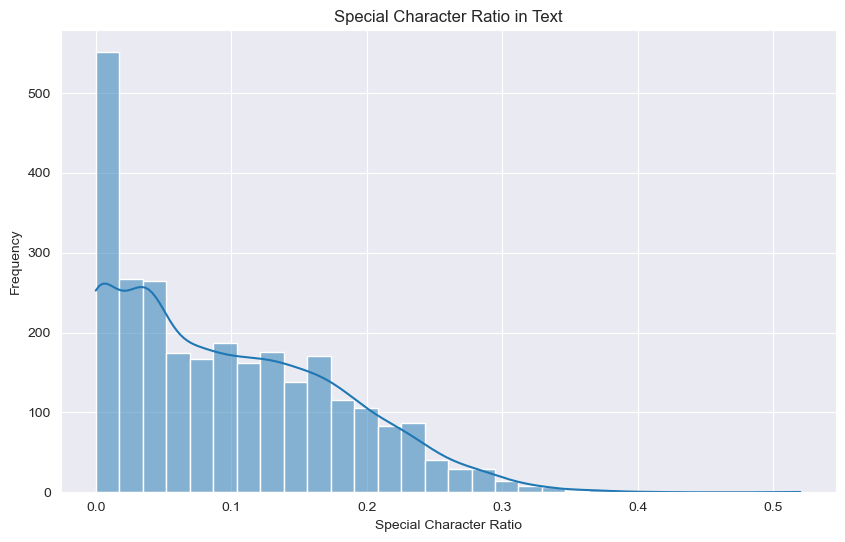

In [17]:
# 2. 텍스트 내 특수문자 비율
def calculate_special_char_ratio(text):
    special_chars = re.findall(r'[^a-zA-Z가-힣0-9\s]', text)  # 한글 및 숫자 제외
    return len(special_chars) / len(text) if len(text) > 0 else 0

df['special_char_ratio'] = df['text'].apply(calculate_special_char_ratio)

plt.figure(figsize=(10, 6))
sns.histplot(df['special_char_ratio'], bins=30, kde=True)
plt.title('Special Character Ratio in Text')
plt.xlabel('Special Character Ratio')
plt.ylabel('Frequency')
plt.show()


# 특수문자 비율에 따른 분류

In [19]:
# 특수문자 비율에 따라 범주화
def categorize_special_char_ratio(ratio):
    if ratio < 0.05:
        return 'Low (<0.05)'
    elif 0.05 <= ratio < 0.1:
        return 'Medium (0.05-0.1)'
    else:
        return 'High (>=0.1)'
    

df['special_char_category'] = df['special_char_ratio'].apply(categorize_special_char_ratio)

    
# 각 범주별로 10개씩 샘플 출력
for category in ['Low (<0.05)', 'Medium (0.05-0.1)', 'High (>=0.1)']:
    print(f"\nCategory: {category}")
    sample_data = df[df['special_char_category'] == category].head(10)
    print(sample_data[['text', 'special_char_ratio']])


Category: Low (<0.05)
                                 text  special_char_ratio
1            평양정상회담 휴식 장소로 이동하는 남북 정상            0.000000
2     책과 함께 보는 영화 4편…한여름 밤의 스크린셀러 영화제            0.032258
3      일 한 번 내보자…여자축구 대표팀 지탱하는 베테랑의 힘            0.033333
4       현대기아차 2차 충돌 대비하는 에어백 세계 최초 개발            0.000000
6         기다렸다 눈과 추위야…강원 스키장 개장 준비 분주            0.037037
7   힐러리 본선에 성큼…트럼프 자력후보 희망 살려 전망은 불투명            0.030303
9        국민 10명 중 8명 혁신 기술로 일자리 줄어들 것            0.000000
11     악성 부채 고려하면 中 성장률 정부 발표치 절반에 불과            0.033333
12   설 최고관광지는 전주한옥마을…빅데이터 분석 2년 연속 1위            0.031250
13  北 중국내 근로자 탈북 막으려 보위부 요원 300명 급파종합            0.030303

Category: Medium (0.05-0.1)
                                   text  special_char_ratio
0              워커 맨시티 공식 입단…英 선수 최대 이적료            0.083333
5     트럼프 中 거래 원해도 美 준비 안돼…이란 체제전환 요구안해            0.090909
8                  게시판 수요낭독공감 8일·22일 개최            0.050000
10         벤투호 12일 출국…호주·우즈베크와 아시안컵 리허설            0.071429
16       밤

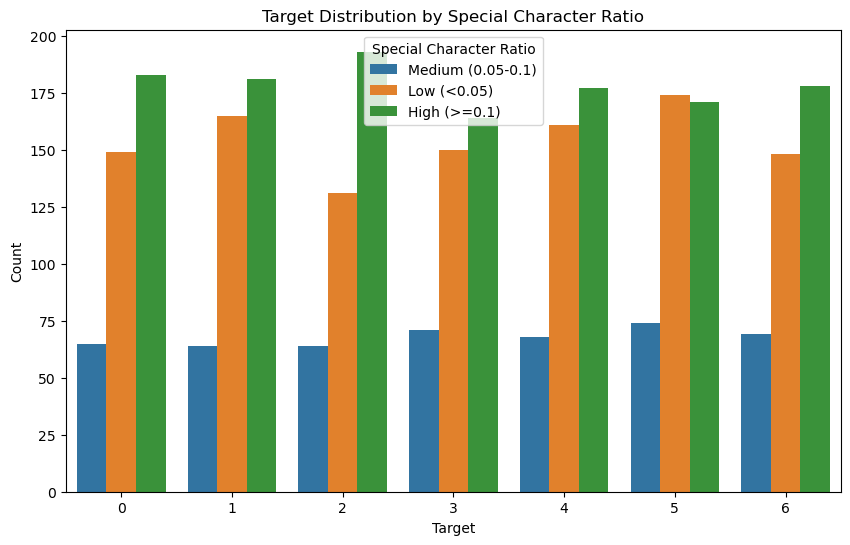

In [42]:


# 시각화
plt.figure(figsize=(10, 6))
sns.countplot(data=df, x='target', hue='special_char_category')
plt.title('Target Distribution by Special Character Ratio')
plt.xlabel('Target')
plt.ylabel('Count')
plt.legend(title='Special Character Ratio')
plt.show()
